Exploratory Data Analysis (EDA) is all about analyzing the dataset and summarizing the key insights and characteristics of the data

**EDA CHECKLIST**


1.   Understanding the dataset and its shape
2.   Checking the data type of each columns
3.   Categorical and Numerical Columns
4.   Checking for missing values
5.   Descriptive summary of the dataset (mean, median, standard deviation etc.)
6.   Groupby for classification problems




# Imports

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Data Collection

In [2]:
df = pd.read_csv('/content/data.csv')

# Exploratory Data Analysis

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df.drop(columns='Unnamed: 32', axis=1, inplace=True)

In [5]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
df.shape

(569, 32)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df.drop(columns='id', axis=1, inplace=True)

The diagnosis column is the only categorical column there. We shall do some label encoding on it later to turn it into numerical data

In [9]:
df.isnull().sum()

,0
diagnosis,0
radius_mean,0
texture_mean,0
perimeter_mean,0
area_mean,0
smoothness_mean,0
compactness_mean,0
concavity_mean,0
concave points_mean,0
symmetry_mean,0


In [10]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


check whether the mean and the median (50th percentile) are close to each other.

When your mean value is greater than your median value we call that 'Right-skewed Data' (or Postively-skewed Data).

when the median value is greater than the mean value then that's called 'Left-skewed Data' (or Negatively-skewed Data).

A normal distribution (No skew) has both mean and median (and even mode) equal to one another.



If there is skewness in the dataset we may need to transform the dataset using transforming methods like log transform.

Whenever you're working with a regression task you may need to transform the dataset if there's some skewness in the dataset


Note: on a distribution graph, we use the tail to judge the skewness, a long tail at the right side of the distribution is what makes it right-skewed and vice-versa. A distribution that has no tail and looks like a bell (the mean, median and mode lies in the center) is a no skew data.

the problem with skewed data is that the distributions having tails means there's not much data points towards the ending or the begining (depending on the type of skewness) so the model won't learn properly compared to a distribution where very thing lies in the center, the distribution is balanced so the model learns properly.

In [11]:
# checking the distribution of the target variable

df['diagnosis'].value_counts()

,count
diagnosis,
B,357
M,212


In [12]:
# label encoding

label_encode = LabelEncoder()

labels = label_encode.fit_transform(df['diagnosis'])

df['target'] = labels

df.drop(columns='diagnosis', axis=1, inplace=True)


In [13]:
df.tail()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,target
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,1
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,1
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,1
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,1
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,0


In [14]:
df['target'].value_counts()

,count
target,
0,357
1,212


Grouping dataset based on target by mean

In [15]:
df.groupby('target').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
target,,,,,,,,,,,,,,,,,,,,,
0,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
1,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530


from this we can see that for most of the features, the mean values are higher for Malignant (1) cases and lower for Benign (0) cases.

**EDA SUMMARY**



1.   No missing values.
2.   All are continuous numerical values except the target column.
3.   Mean is slightly higher than the median for most of the features. So it is right skewed.
4.   Slight imbalance in the dataset (Benign(0) cases are more than Malignant(1) cases).
5.  Mean for most features are clearly larger for Malignant cases compared to the Benign cases (Groupby).



# Data Visualization

<Axes: xlabel='target', ylabel='count'>

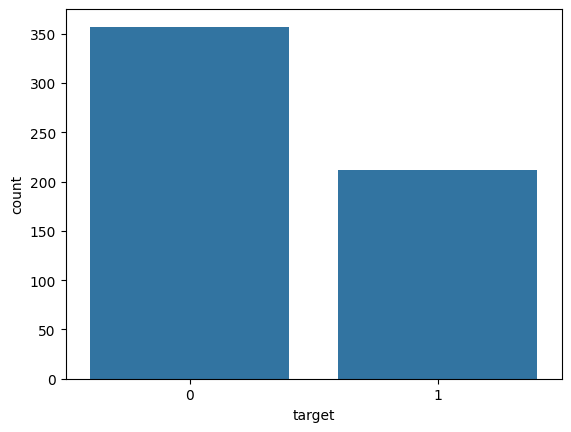

In [17]:
# countplot for the target column for checking the distribution of target

sns.countplot(x='target', data=df)

Distribution plot for all coulmns

In [18]:
# here's how to get all the column names of the dataframe

for column in df:
  print(column)

radius_mean
texture_mean
perimeter_mean
area_mean
smoothness_mean
compactness_mean
concavity_mean
concave points_mean
symmetry_mean
fractal_dimension_mean
radius_se
texture_se
perimeter_se
area_se
smoothness_se
compactness_se
concavity_se
concave points_se
symmetry_se
fractal_dimension_se
radius_worst
texture_worst
perimeter_worst
area_worst
smoothness_worst
compactness_worst
concavity_worst
concave points_worst
symmetry_worst
fractal_dimension_worst
target


/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


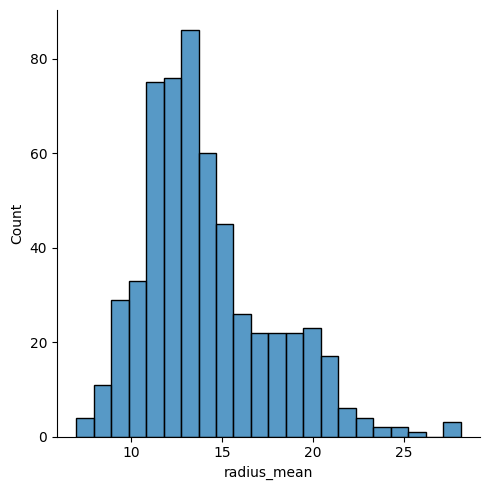

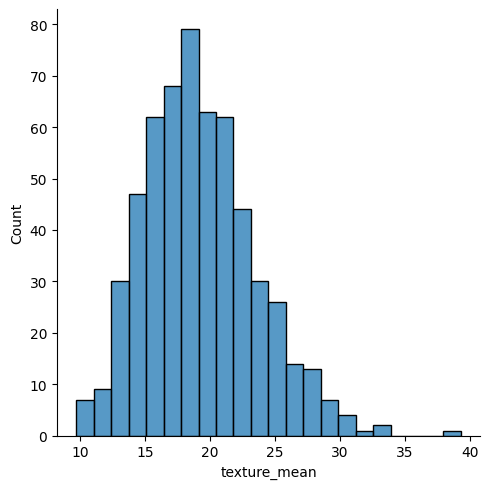

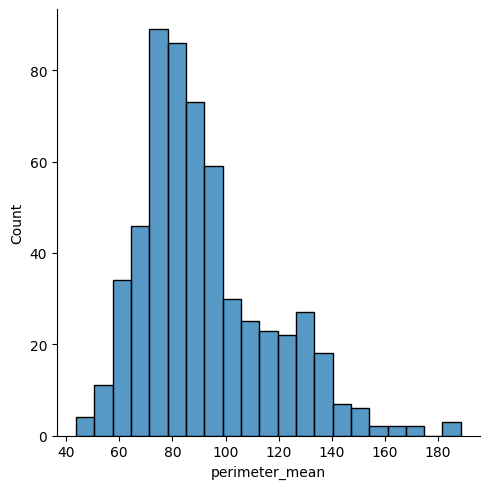

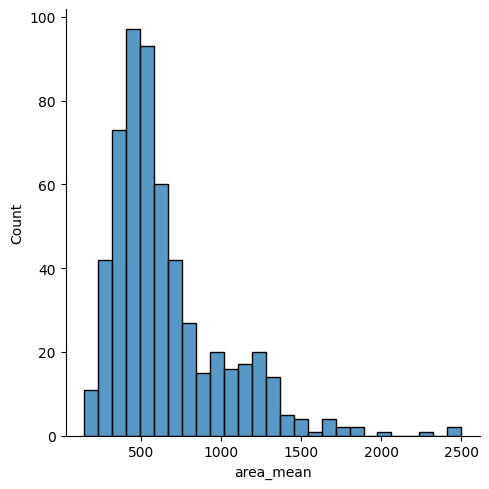

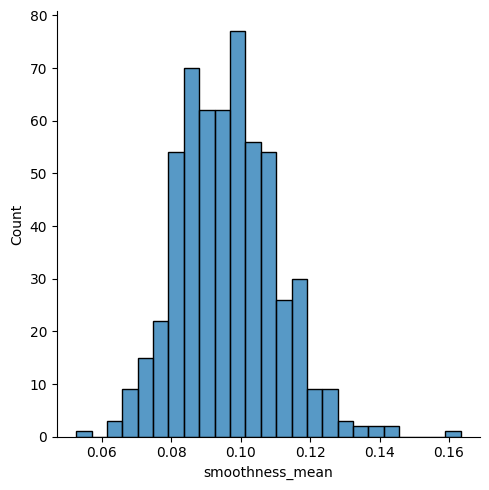

...

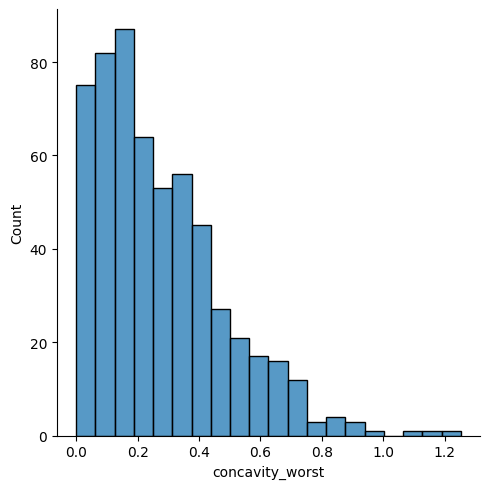

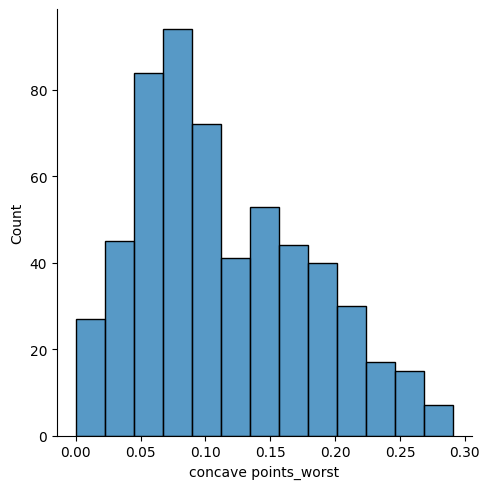

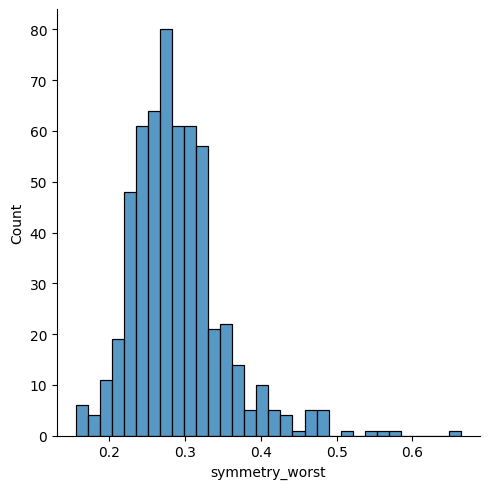

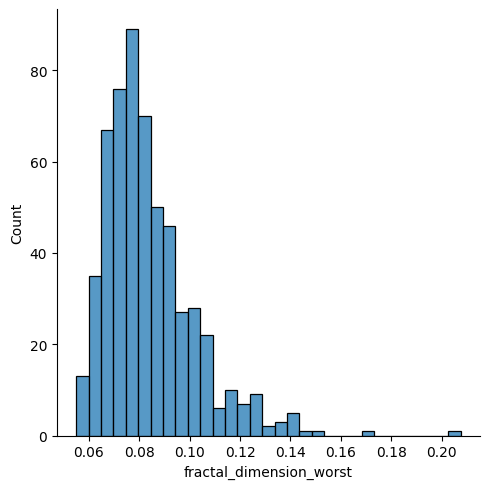

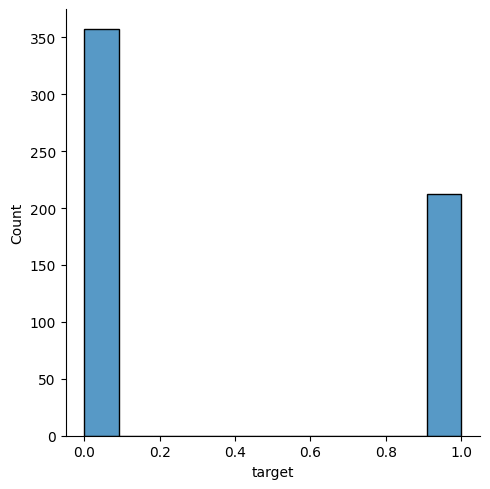

In [19]:
# create a loop to get the distribution plot for all columns

for column in df:
  sns.displot(x=column, data=df)

The histograms plotted above are called a univariant analysis because we're taking one variable at a time and we're analyzing it.

most of the features in the histogram are right-skewed.

so if your data lies in the range of skewness (the tails) then the model won't learn properly because it doesn't have much data to work with. but if it lies within the balanced region (where there's a congestion of a lot of high bars) then the model can make better predictions.

<ipython-input-21-bbd6971ec6a9>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df.radius_mean)


<Axes: ylabel='Density'>

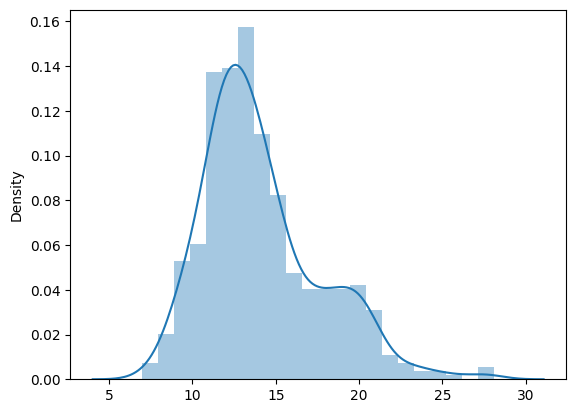

In [21]:
# we can also build a distribution plot with a curve

sns.distplot(x=df.radius_mean) # not 'displot' but 'distplot'

Anyway, it's quite clear that most of the features are right skewed.

Transforming it using methods like log transform can fix the issue and balance the distribution.

pair plot

pair plot takes a lot of time if the number of features is more.

In [22]:
# pairplot
sns.pairplot(df)
plt.show()

This type of analysis is called a bivariant analysis because we're taking two variables and trying to find the relationship between them.

The diagonal is just the same features being plotted against themselves. It's not a scatter plot because if it was it would just plot a 45 degree line and you won't get much insight from that I guess, so they used an histogram when a feature is plotted against itself.

The rest of the pairplot are scatter plots though. If the scatter plot looks like it's 'ascending' (like the higher the values of a feature then the higher the value of the other feature plotted against it), the points in general go from low on the graph to high on the graph then it means there is a positive relationship between those features (positive coorelation).

A good example is the 'perimeter_worst' feature against the 'radius_mean' feature. (if you can squint your eyes or zoom in and see).

It's also cool to know that we can build a coorelation matrix which is somewhat similar to the point of a pairplot. A coorelation matrix allows us to see the, well, coorelation between each variable. we'll probably see that later.

This is how we can build individual pairplot (cos the main one can take too long if there are a lot of features):

scatter plot for the first 2 columns

In [23]:
# first column of the dataset as a series
first_column = df.iloc[:, 0]

# second column of the dataset as a series
second_column = df.iloc[:, 1]

In [25]:
print(first_column)
print('----------')
print(second_column)

0      17.99
1      20.57
2      19.69
3      11.42
4      20.29
       ...  
564    21.56
565    20.13
566    16.60
567    20.60
568     7.76
Name: radius_mean, Length: 569, dtype: float64
----------
0      10.38
1      17.77
2      21.25
3      20.38
4      14.34
       ...  
564    22.39
565    28.25
566    28.08
567    29.33
568    24.54
Name: texture_mean, Length: 569, dtype: float64


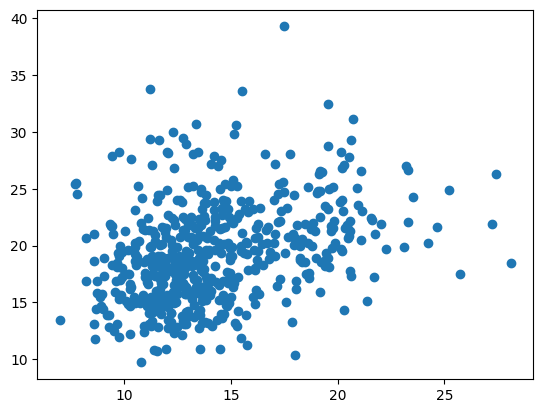

In [26]:
plt.scatter(x=first_column, y=second_column)

Outlier Detection

Outliers can either be mistakes (somone wrongly entering the data) or be natural (list of people's salary and elon musk is part of those people).

Box plot for visualizing the outliers in the dataset

<ipython-input-27-8ad9a7660e9d>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


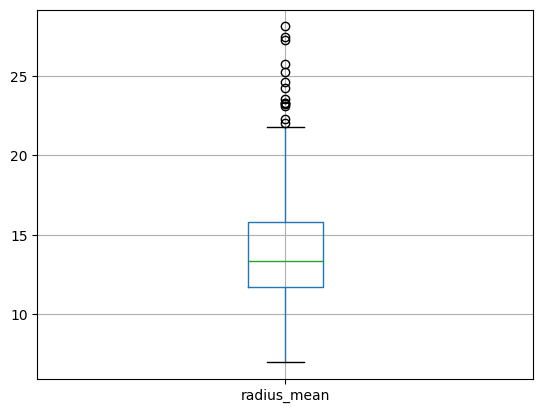

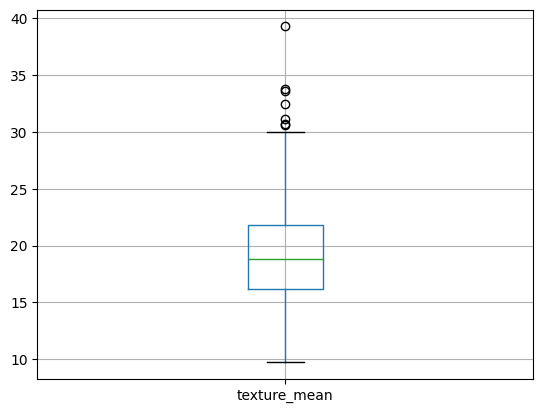

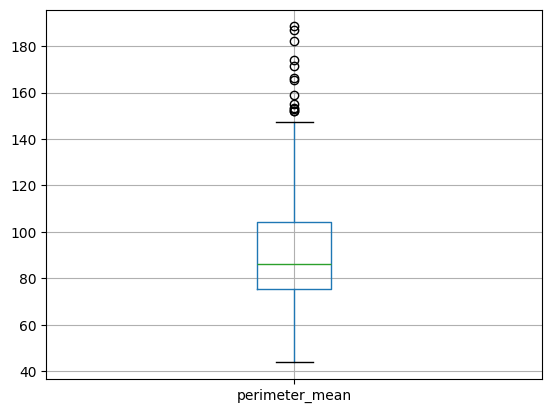

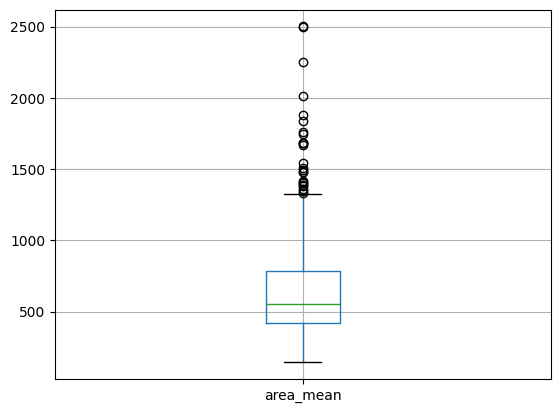

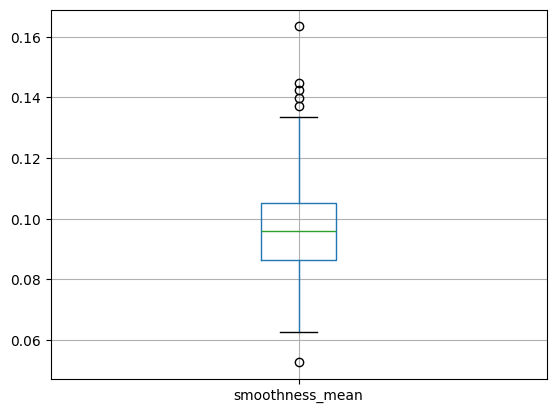

...

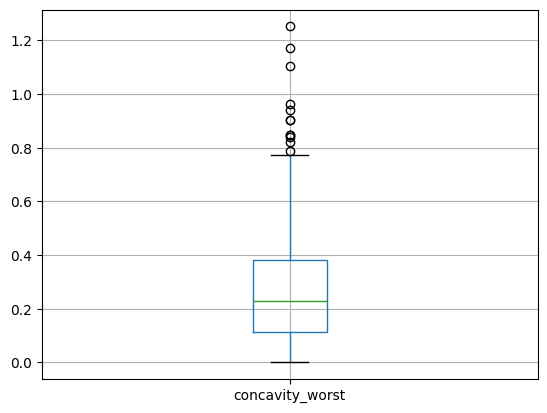

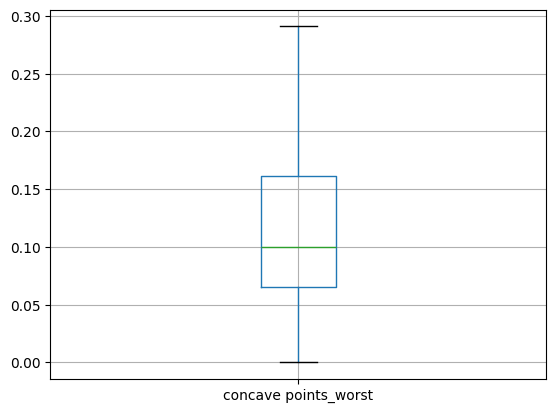

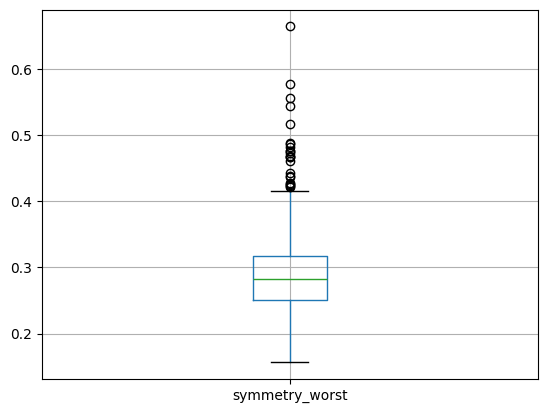

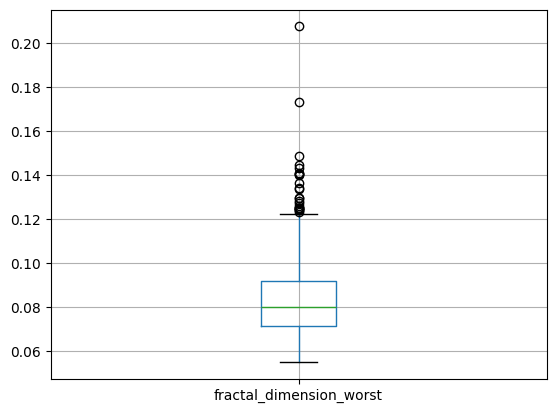

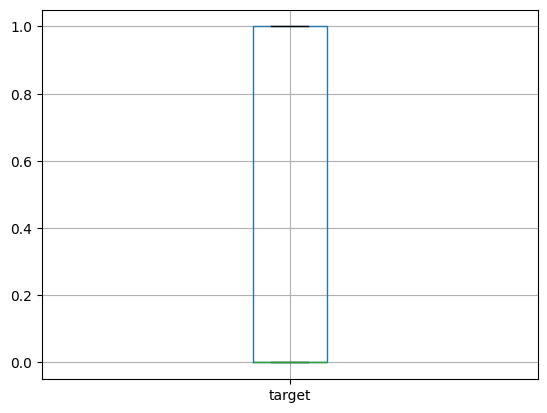

In [27]:
for column in df:
  plt.figure()
  df.boxplot([column])

These plots are called the 'box and whisker plot'

The black circles represents the outliers we have.
Those 2 black lines above and below the box are called the whiskers.

The line below the box represents the minimum value (make reference to the .describe() to understand better).

The line above the box represents the maximum value.

The bottom part of the box (the blue line on the lower side of the box that's close to the black line below the box) represnts the 25th percentile value.

The upper part of the box (the blue line on the upper side of the box that's close to the black line above the box) represnts the 75th percentile value.

The green color line inside the box represnts the 50th percentile.

So, speaking in terms of quartiles, 25th percentile is Q1, 50th percentile is Q2, 75th percentile is Q3 and the max value is Q4. The lines on the boxplot that represents them are also called these.

Now, since the upper and lower part of the box are the 75th percentile (Q3) and 25th percentile (Q1) respectively,  the difference between them (or the range) is called an 'Interquartile range'. That's the distance from Q3 to Q1 which also makes up the sides of the box.

Now, the lines that connect the black lines (above and below the box) to the box are actually 1.5 times the interquartile range (I actually don't really understand this part).

Now when you have data points that are more or less than 1.5 x interquartile range (that means black circles above or below the black lines which are actually the maximum and minimum values), then those values are called outliers.

You can always use a formula based on everything I've said to figure it out.

So once we've found out that there are outliers we can't feed that into the model (especially for a regression task).

What we would do is replace the values, maybe with their median value or mean value.

Note: Replace with median value when you have A LOT of outliers but replace with mean value when you don't have that much outliers.

Outliers are also important when there are missing values because they also contribute to the outlier problem so just follow the 'Note' stated.

Coorelation Matrix

In [28]:
correlation_matrix = df.corr()

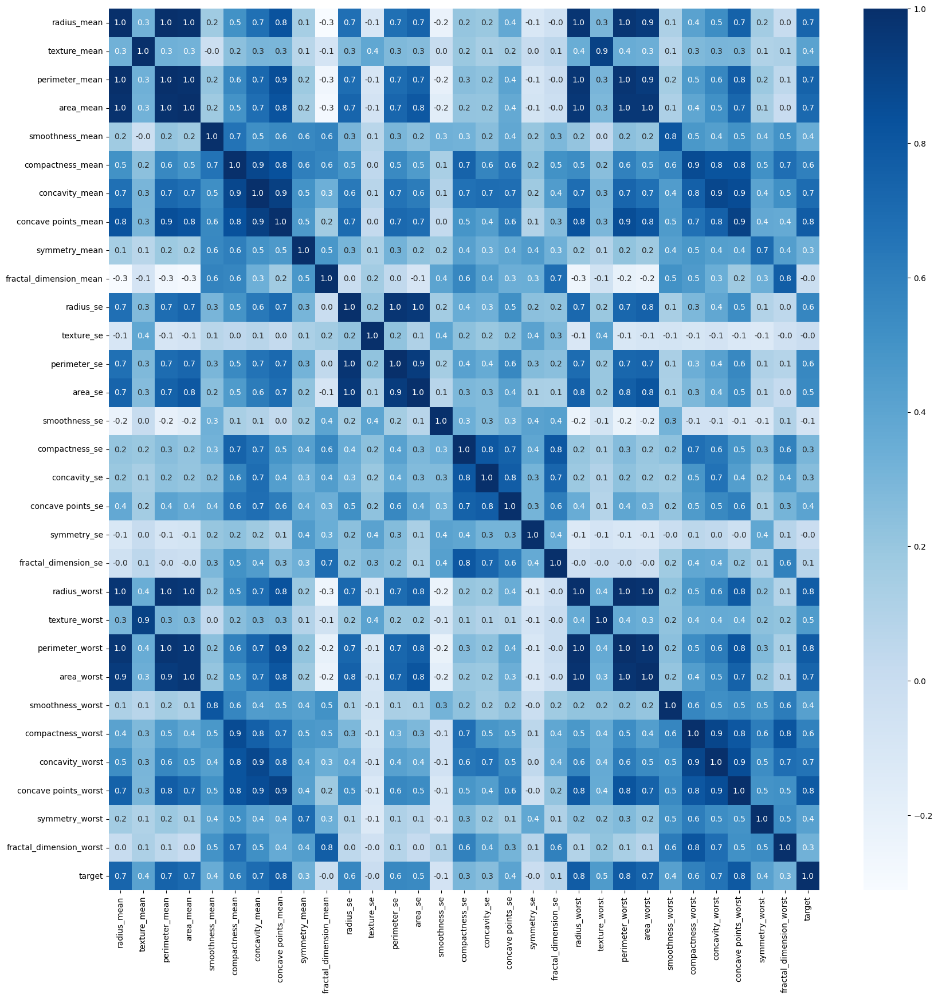

In [29]:
# cnstructing the correlation matrix

plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, cbar=True, fmt='.1f', annot=True, cmap='Blues')
plt.savefig('Correlation Heat Map') # to save the matrix

I believe this should be self-explanatory

Now, one thing to note is that when you have values that have a very strong correlation with each other, there's no point in having all of them there, you can simply leave one of them and remove the rest since they're basically the same in a way.

A good example is the 'radius_mean','perimeter_mean' and the 'area_mean' features which have a correation of 1.0. That's very strong! so you can just remove (drop) 'preimeter_mean' and 'area_mean' and leave 'radius_mean' when feeding the data into the model since radius_mean can reprsent them and do the job for them (if you get my drift).

There's no point in having mutliple variables with strong correlation (by stron I mean 1.0 on the dot) when training the model. We don't want multiple features which are very similar to each other.

Same thing goes for negative correlations, not just positives.

All what I said above is called the **Multicollinearity Problem**.

Multicollinearity exists when an independent variable is highly correlated with one or more independent variables.

We can remove the features if they have high +ve or -ve correlation between them.

**Inference from Data Visualization**



1.   Most of the features have outliers.
2.   Correlation matrix reveals that most of the features are highly correlated. So we can remove some of them during feature selection.



**EDA AND DATA VISUALIZATION SUMMARY**



1.   No missing values.
2.   All are continuous numerical values except the target column.
3.   Mean is slightly higher than the median for most of the features. So it is right skewed.
4.   Slight imbalance in the dataset (Benign(0) cases are more than Malignant(1) cases).
5.   Mean for most features are clearly larger for Malignant cases compared to the Benign cases (Groupby).
6.   Most of the features have outliers.
7.   Correlation matrix reveals that most of the features are highly correlated. So we can remove some of them during feature selection.







